In [1]:
#hide
#all_examples

# Using fastai for semantic segmentation

Here we use U-net for semantic segmentation of deadwood. This notebook is based on a notebook the "Using fastai for segmentation" by Janne Mäyrä.

In [1]:
from pathlib import Path
from drone_detector.processing.tiling import * #Commented this one out 18.3.2022 because Janne updated the tiling on 10.3.2022. Look into how to set up the new tiling.
import os
from fastai.vision.all import *
from drone_detector.engines.fastai.data import *
from drone_detector.metrics import * # JaccardCoeffMulti is imported from here
import geopandas as gpd
import rasterio as rio
from rasterio import plot as rioplot

## Tiling the data

In [2]:
tile_folder = Path('/scratch/deadwood/segmentation/models/proto10/train/images')
vector_folder = Path('/scratch/deadwood/segmentation/models/proto10/train/vectors')

outpath = Path('/scratch/deadwood/segmentation/models/proto10/processed')

if not os.path.exists(outpath): os.makedirs(outpath)

tiles = sorted(os.listdir(tile_folder))
vectors = sorted([f for f in os.listdir(vector_folder) if f.endswith('geojson')])
assert len(tiles) == len(vectors)

The vectors (.geojson files) do not have a column called 'groundwood', only a column called 'label' of type string ('groundwood' and 'uprightwood'). Here we convert the contents of the 'label' column to a column called 'groundwood' with integer values of 1 (uprightwood) and 2 (groundwood).

In [20]:
### For the older tiler before the update 10.3.2022
#for fname in os.listdir(vector_folder):
#   gdf = gpd.read_file(vector_folder/fname)
#   gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
#   gdf.to_file(vector_folder/fname)

/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:

For semantic segmentation, we split the data into a 256 times 256 pixel grid. Vector files are then tiled and rasterized to the same grid, in such way that raster images are saved. This method saves target mask for each cell even if they don't contain any masks.

In [12]:
for t in tiles:
    if not os.path.exists(outpath/t[:-4]): os.makedirs(outpath/t[:-4])
    shp_fname = t.replace('tif', 'geojson')
    tilesize = 256
    tiler = Tiler(outpath=outpath/t[:-4], gridsize_x=tilesize, gridsize_y=tilesize, overlap=(0,0))
    tiler.tile_raster(str(tile_folder/t))
    #tiler.tile_and_rasterize_vector(vector_folder/shp_fname, column='groundwood')
    #tiler.tile_and_rasterize_vector('/scratch/deadwood/segmentation/models/proto10/train/images/14_1137.tif', '/scratch/deadwood/segmentation/models/proto10/train/vectors/14_1137.geojson', 'groundwood', keep_bg_only=False)
    tiler.tile_and_rasterize_vector(tile_folder/t, vector_folder/shp_fname, column='groundwood', keep_bg_only=False)
    #tile_and_rasterize_vector(self, path_to_raster:str, path_to_vector:str, column:str, keep_bg_only:bool=False)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

In [13]:
for d in os.listdir(outpath):
    print(f"""{d} was split into {len(os.listdir(outpath/d/'raster_tiles'))} raster cells and {len(os.listdir(outpath/d/"rasterized_vector_tiles"))} vector cells""")

49_1256 was split into 64 raster cells and 64 vector cells
35_1206 was split into 64 raster cells and 64 vector cells
44_1234 was split into 64 raster cells and 64 vector cells
3_1091 was split into 64 raster cells and 64 vector cells
52_1259 was split into 64 raster cells and 64 vector cells
14_1137 was split into 64 raster cells and 64 vector cells


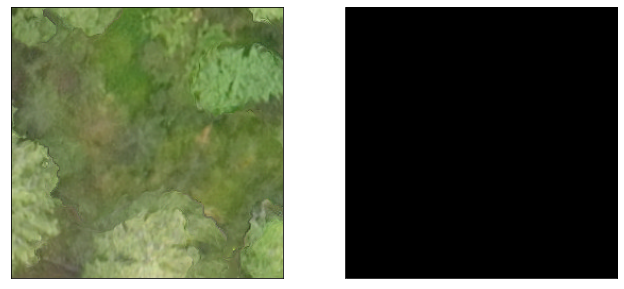

In [30]:
ex_file = random.sample(os.listdir(outpath/d/'rasterized_vector_tiles'), 1)[0]
fig, axs = plt.subplots(1,2, figsize=(11,5))
for a in axs:
    a.set_xticks([])
    a.set_yticks([])
with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
    rioplot.show(im, ax=axs[0])
with rio.open(outpath/d/"rasterized_vector_tiles"/ex_file) as mask:
    rioplot.show(mask, ax=axs[1])

## Segmentation

In [2]:
outpath = Path('/scratch/deadwood/segmentation/models/proto10/processed/')

if not os.path.exists(outpath): os.makedirs(outpath)

fnames = [Path(f'{outpath}/{tile}/raster_tiles/{f}') 
         for tile in [til for til in os.listdir(outpath) if os.path.isdir(outpath/til) and til != 'segmentation']
         for f in os.listdir(outpath/tile/'rasterized_vector_tiles')]

dls = SegmentationDataLoaders.from_label_func('/scratch/deadwood/segmentation/models/proto10/processed', bs=16,
                                              codes=['Standing', 'Fallen'],
                                              fnames = fnames,
                                              label_func=partial(label_from_different_folder,
                                                                 original_folder='raster_tiles',
                                                                 new_folder='rasterized_vector_tiles'),
                                              item_tfms=[Resize(256)],
                                                   batch_tfms= [
                                                       *aug_transforms(size=224),
                                                       Normalize.from_stats(*imagenet_stats)
                                              ])

/opt/conda/lib/python3.9/site-packages/torch/_tensor.py:1051: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


In [3]:
dls.one_batch()

(TensorImage([[[[ 8.6141e-01,  9.4753e-01,  9.7722e-01,  ..., -8.8797e-01,
            -7.5456e-01, -6.3353e-01],
           [ 5.6773e-01,  6.7669e-01,  7.8334e-01,  ..., -4.4518e-01,
            -3.7049e-01, -4.1557e-01],
           [ 2.4008e-01,  2.9868e-01,  3.9173e-01,  ..., -1.4545e-01,
            -2.1121e-01, -5.5765e-01],
           ...,
           [ 5.7059e-01,  4.4635e-01,  6.1659e-01,  ..., -1.5249e-01,
            -2.0989e-01, -2.1406e-01],
           [ 6.7005e-01,  5.3135e-01,  5.7918e-01,  ..., -1.8775e-01,
            -1.7301e-01, -1.0918e-01],
           [ 5.5226e-01,  5.6420e-01,  5.6103e-01,  ..., -2.0949e-01,
            -1.8494e-01, -1.3084e-01]],
 
          [[ 1.2187e+00,  1.3256e+00,  1.3171e+00,  ..., -2.7503e-01,
            -1.5201e-01,  1.5857e-02],
           [ 8.9451e-01,  1.0005e+00,  1.1231e+00,  ...,  1.5867e-01,
             2.1514e-01,  2.7688e-01],
           [ 5.8097e-01,  6.2602e-01,  7.3240e-01,  ...,  5.5451e-01,
             3.2389e-01,  9.9190e-

`label_from_different_folder` is a helper located in `drone_detector.engines.fastai.data`. That module also contains helpers to use with for instance multispectral images or time series of images.

In [4]:
dls.show_batch(max_n=16)

AttributeError: 'Figure' object has no property 'add_vert'

## Training the model

**From Janne's notebook:**
*Train basic U-Net, using pretrained Resnet50 as the encoder. `to_fp16()` tells our model to use half precision training, thus using less memory. Loss function is `FocalLossFlat`, and for segmentation we need to specify `axis=1`. Metrics are `Dice` and `JaccardCoeff`, fairly standard segmentation metrics.*

We change the metrics to DiceMulti(), JaccardCoeffMulti(). JaccardCoeffMulti is in drone_detector.metrics.

n_out should be 3, (n_out=3) because we have 3 classes (groundwood, standing and the background).

In [6]:
learn = unet_learner(dls, resnet50, pretrained=True, n_in=3, n_out=3,
                     metrics=[DiceMulti(), JaccardCoeffMulti()], loss_func=FocalLossFlat(axis=1)
                    ).to_fp16()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /users/tavutavu/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Search for a suitable learning rate.

SuggestedLRs(valley=1.737800812406931e-05)

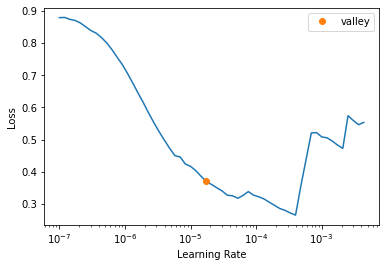

In [7]:
learn.lr_find()

Train the model for 2 epochs with encoder layers frozen and 10 epochs with all layers unfrozen.

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.209235,0.055081,0.331299,0.000040,00:17
1,0.113584,0.032969,0.446376,0.104051,00:13


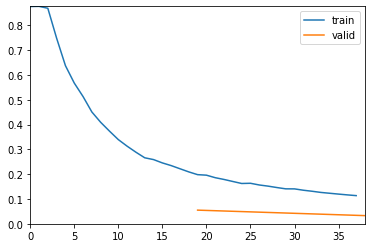

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.027527,0.016354,0.479062,0.141905,00:14
1,0.027464,0.027189,0.355375,0.018725,00:13
2,0.031179,0.016327,0.497284,0.155429,00:13
3,0.026367,0.011306,0.635782,0.314512,00:13
4,0.022145,0.010642,0.670333,0.367128,00:13
5,0.019457,0.007998,0.719798,0.426477,00:13
6,0.016836,0.007398,0.725095,0.438669,00:13
7,0.014899,0.006839,0.743343,0.464418,00:13
8,0.013368,0.006551,0.756540,0.484709,00:13
9,0.012277,0.006279,0.765081,0.499120,00:13


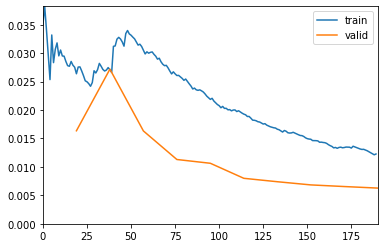

In [8]:
from fastai.callback.progress import ShowGraphCallback
learn.fine_tune(10, freeze_epochs=2, base_lr=1e-4, cbs=ShowGraphCallback)

Return to full precision.

In [9]:
learn.to_fp32()

Check results.

In [2]:
learn.show_results(max_n=8)

NameError: name 'learn' is not defined

Export the model to use later.

In [15]:
learn.path = Path('/scratch/deadwood/segmentation/models/')
learn.export('unet-segmentation-test.pkl')

## Test with holdout

This part is from U-Net Hiidenportti.ipynb

In [14]:
from drone_detector.engines.fastai.predict import predict_segmentation
# from drone_detector.engines.fastai.predict import predict_segmentation_fastai # The import is different than in the U-Net Hiidenportti.ipynb. From Janne's comment in Teams

In [15]:
test_rasters = [f'/scratch/deadwood/segmentation/models/proto10/test/images/{f}'
                for f in os.listdir('/scratch/deadwood/segmentation/models/proto10/test/images/') if f.endswith('tif')]

In [16]:
for t in test_rasters:
    outfile_name = f'/scratch/deadwood/segmentation/models/proto10/test/results/{t.split("/")[-1]}'
    predict_segmentation('/scratch/deadwood/segmentation/models/unet-segmentation-test.pkl', t, outfile_name, 
                         processing_dir='temp', use_tta=False,
                         tile_size=230, tile_overlap=115)

Processing folder exists
Processing folder exists


## From the "Using fastai for segmentation" notebook

Some helper functions for inference, such as removing all resizing transforms.

In [ ]:
def label_func(fn):
    return str(fn).replace('raster_tiles', 'mask_tiles')

@patch 
def remove(self:Pipeline, t):
    for i,o in enumerate(self.fs):
        if isinstance(o, t.__class__): self.fs.pop(i)
            
@patch
def set_base_transforms(self:DataLoader):
    attrs = ['after_item', 'after_batch']
    for i, attr in enumerate(attrs):
        tfms = getattr(self, attr)
        for j, o in enumerate(tfms):
            if hasattr(o, 'size'):
                tfms.remove(o)
            setattr(self, attr, tfms)

Load learners and remove all resizing transforms.

In [ ]:
testlearn = load_learner('/scratch/deadwood/segmentation/models/unet-segmentation-test-10plots.pkl', cpu=False)
testlearn.dls.valid.set_base_transforms()

The model is tested with 4 different map patches from different areas and sizes. Two of the images are from 1965 and two from 1984. Image sizes vary between 600x600 and 1500x1500 pixels.

In [ ]:
import PIL
def unet_predict(fn):
    image = np.array(PIL.Image.open(fn))
    mask = testlearn.predict(PILImage.create(image))[0].numpy()
    img = image
    img[:,:,0][mask==0] = 0
    img[:,:,1][mask==0] = 0
    img[:,:,2][mask==0] = 0
    img = PIL.Image.fromarray(img.astype(np.uint8))
    return img

In [ ]:
test_images = [f'../data/historic_map/test_patches/{f}' for f in os.listdir('../data/historic_map/test_patches/')]

First result.

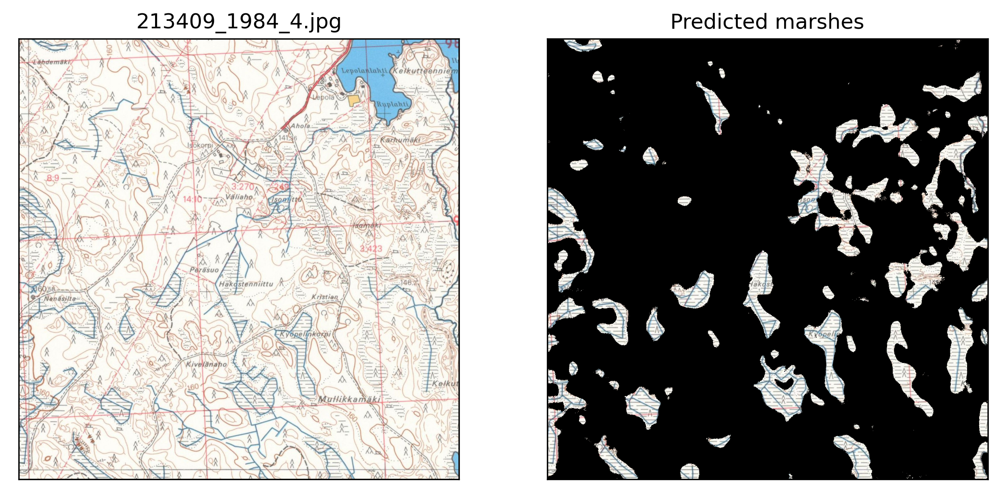

In [ ]:
patch_pred = unet_predict(test_images[0])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[0]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[0].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Second result

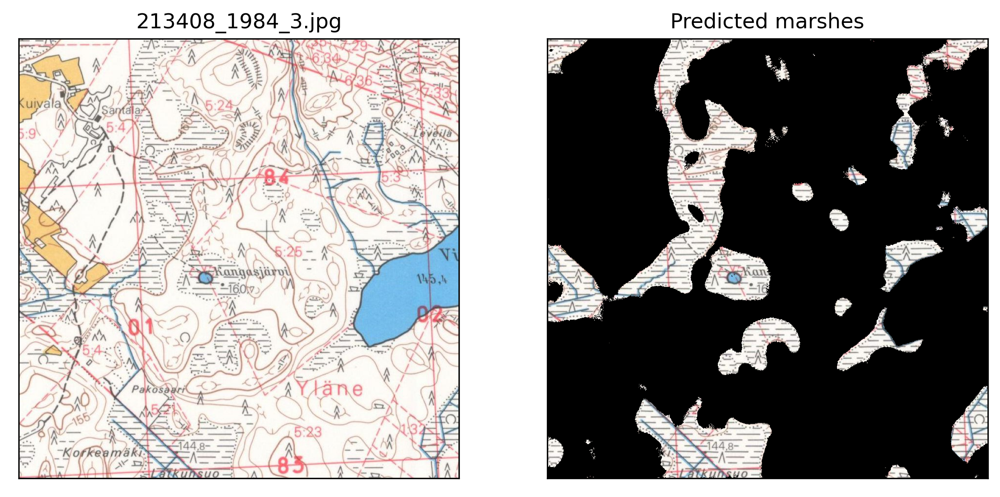

In [ ]:
patch_pred = unet_predict(test_images[1])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[1]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[1].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Third result

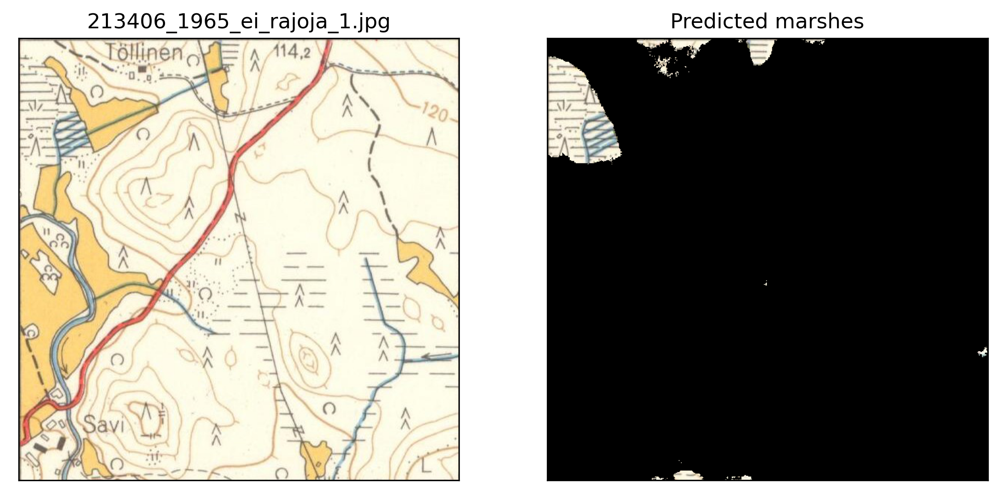

In [ ]:
patch_pred = unet_predict(test_images[2])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[2]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[2].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Fourth example.

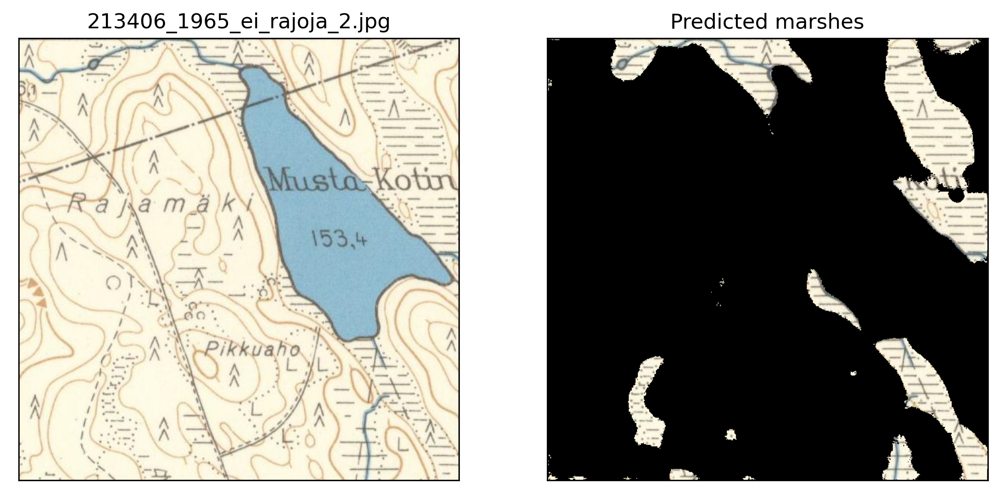

In [ ]:
patch_pred = unet_predict(test_images[3])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[3]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[3].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

In [ ]:
# hide

from nbdev.export import notebook2script
notebook2script()
!nbdev_build_docs

Converted 00_utils.ipynb.
Converted 01_metrics.ipynb.
Converted 10_processing.tiling.ipynb.
Converted 11_processing.coordinates.ipynb.
Converted 12_processing.coco.ipynb.
Converted 13_processing.postprocessing.ipynb.
Converted 20_engines.icevision.models.ipynb.
Converted 21_engines.icevision.predict.ipynb.
Converted 30_engines.fastai.data.ipynb.
Converted 31_engines.fastai.losses.ipynb.
Converted 32_engines.fastai.augmentations.ipynb.
Converted 33_engines.fastai.predict.ipynb.
Converted 40_engines.detectron2.predict.ipynb.
Converted examples.fastai.segmentation.ipynb.
Converted examples.tiling.ipynb.
Converted index.ipynb.
Converted overview.engines.ipynb.
converting: /scratch/mayrajan/drone_detector/nbs/examples.fastai.segmentation.ipynb
converting /scratch/mayrajan/drone_detector/nbs/index.ipynb to README.md
